In [2]:
# Installing the pakages of these libraries
# then import these libraries in the editor

In [80]:
pip install folium

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.4/108.4 kB 2.5 MB/s eta 0:00:00 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [61]:
pip install nltk

Note: you may need to restart the kernel to use updated packages.


In [70]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import folium
from folium.plugins import MarkerCluster

import nltk
from nltk.corpus import stopwords
from collections import Counter

In [12]:
# importing the dataset from the system

data = pd.read_csv("Task_Dataset.csv")
print(data.head())

   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

In [14]:
df.describe()
#this will describe the numeric coloumns of the csv file.

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


# Level 1 - Task 1

In [19]:
# Task: Top Cuisines
# Determine the top three most common cuisines in the dataset.
# Calculate the percentage ofrestaurants that serve each of the top cuisines.

In [27]:
# Now that we have the dataset loaded, we will focus on the 'Cuisines' column to find the top 3 most common cuisines.

# First, we'll split the multiple cuisines in the 'Cuisines' column and calculate the count for each unique cuisine.
# After that, we'll calculate the percentage of restaurants serving each cuisine.

# Split the 'Cuisines' column and explode it into multiple rows
cuisines_split = data['Cuisines'].str.split(', ').explode()

# Get the top 3 most common cuisines
top_cuisines = cuisines_split.value_counts().nlargest(3)

# Calculate the percentage of restaurants that serve each of the top cuisines
total_restaurants = len(data)
top_cuisines_percentage = (top_cuisines / total_restaurants) * 100

top_cuisines, top_cuisines_percentage


(Cuisines
 North Indian    3960
 Chinese         2735
 Fast Food       1986
 Name: count, dtype: int64,
 Cuisines
 North Indian    41.461627
 Chinese         28.635745
 Fast Food       20.793634
 Name: count, dtype: float64)

# Level 1 - Task 2

In [31]:
# Task: City Analysis
# Identify the city with the highest number of restaurants in the dataset.
# Calculate the average rating for restaurants in each city.
# Determine the city with the highest average rating.

In [33]:

# 1. Identify the city with the highest number of restaurants
restaurant_count_by_city = data.groupby('City')['Restaurant ID'].count().sort_values(ascending=False)
city_with_highest_restaurants = restaurant_count_by_city.idxmax()
highest_number_of_restaurants = restaurant_count_by_city.max()

print(f"City with the highest number of restaurants: {city_with_highest_restaurants} ({highest_number_of_restaurants} restaurants)")

# 2. Calculate the average rating for each city
average_rating_by_city = data.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)

# 3. Determine the city with the highest average rating
city_with_highest_average_rating = average_rating_by_city.idxmax()
highest_average_rating = average_rating_by_city.max()

print(f"City with the highest average rating: {city_with_highest_average_rating} (Average rating: {highest_average_rating})")


City with the highest number of restaurants: New Delhi (5473 restaurants)
City with the highest average rating: Inner City (Average rating: 4.9)


# Level 1 - Task 3

In [36]:
# Task: Price Range Distribution
# Create a histogram or bar chart to visualize the distribution of price ranges among the restaurants.
# Calculate the percentage of restaurants in each price range category.

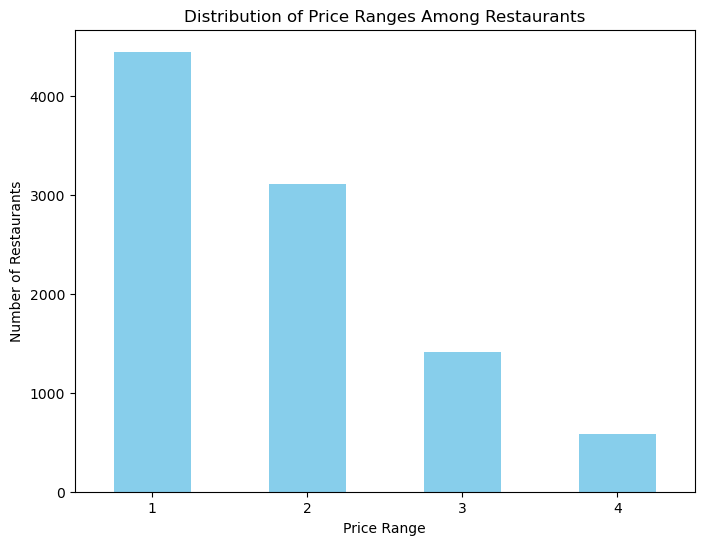

Price range
1    46.529159
2    32.593446
3    14.741912
4     6.135483
Name: count, dtype: float64

In [38]:
# 1. Create a bar chart to visualize the distribution of price ranges among restaurants
price_range_distribution = data['Price range'].value_counts().sort_index()

# Plotting the bar chart
plt.figure(figsize=(8, 6))
price_range_distribution.plot(kind='bar', color='skyblue')
plt.title('Distribution of Price Ranges Among Restaurants')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=0)
plt.show()

# 2. Calculate the percentage of restaurants in each price range category
total_restaurants = data['Price range'].count()
price_range_percentage = (price_range_distribution / total_restaurants) * 100

# Display the percentage of restaurants in each price range
price_range_percentage

# Level 1 - Task 4

In [41]:
# Task: Online Delivery
# Determine the percentage of restaurantsthat offer online delivery.
# Compare the average ratings of restaurants with and without online delivery.

In [45]:
# 1. Determine the percentage of restaurants that offer online delivery
online_delivery_counts = data['Has Online delivery'].value_counts()
total_restaurants = data['Has Online delivery'].count()

# Calculate the percentage of restaurants that offer online delivery
online_delivery_percentage = (online_delivery_counts['Yes'] / total_restaurants) * 100
print(f"Percentage of restaurants offering online delivery: {online_delivery_percentage:.2f}%")

# 2. Compare the average ratings of restaurants with and without online delivery
average_rating_with_delivery = data[data['Has Online delivery'] == 'Yes']['Aggregate rating'].mean()
average_rating_without_delivery = data[data['Has Online delivery'] == 'No']['Aggregate rating'].mean()

print(f"Average rating of restaurants with online delivery: {average_rating_with_delivery:.2f}")
print(f"Average rating of restaurants without online delivery: {average_rating_without_delivery:.2f}")

Percentage of restaurants offering online delivery: 25.66%
Average rating of restaurants with online delivery: 3.25
Average rating of restaurants without online delivery: 2.47


# Level 2 - Task 1

In [48]:
# Task: Restaurant Ratings
# Analyze the distribution of aggregate ratings and determine the most common rating range.
# Calculate the average number of votes received by restaurants.

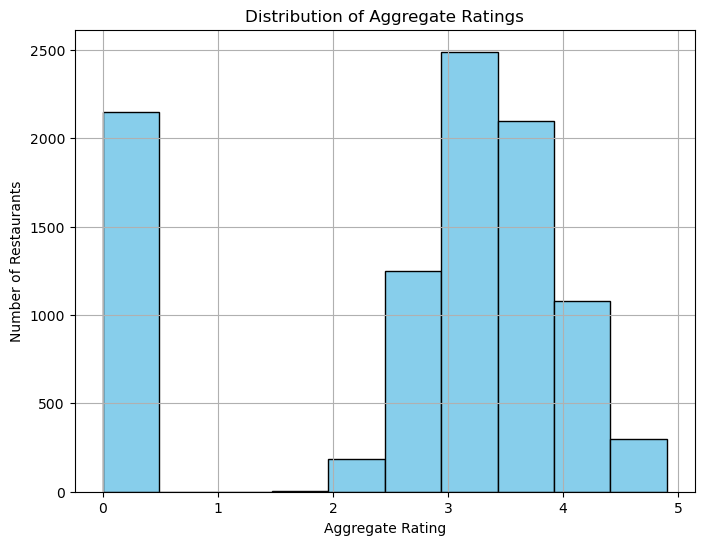

The most common rating range is: (2.94, 3.43]
Average number of votes received by restaurants: 156.91


In [53]:
# 1. Analyze the distribution of aggregate ratings and determine the most common rating range
plt.figure(figsize=(8, 6))
plt.hist(data['Aggregate rating'], bins=10, color='skyblue', edgecolor='black')
plt.title('Distribution of Aggregate Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Number of Restaurants')
plt.grid(True)
plt.show()

# Determine the most common rating range
most_common_rating_range = pd.cut(data['Aggregate rating'], bins=10).value_counts().idxmax()
print(f"The most common rating range is: {most_common_rating_range}")

# 2. Calculate the average number of votes received by restaurants
data['Votes'] = pd.to_numeric(data['Votes'], errors='coerce')  # Convert 'Votes' to numeric (handling errors)
average_votes = data['Votes'].mean()

print(f"Average number of votes received by restaurants: {average_votes:.2f}")


# Level 2 - Task 2

In [59]:
# Task: Cuisine Combination
# Identify the most common combinations of cuisines in the dataset.
# Determine if certain cuisine combinations tend to have higher ratings.

In [63]:
# 1. Identify the most common combinations of cuisines
# Split the 'Cuisines' column by commas, strip whitespace, and count occurrences
cuisine_combinations = data['Cuisines'].value_counts()

# Display the top 10 most common cuisine combinations
most_common_combinations = cuisine_combinations.head(10)
print("Most common cuisine combinations:")
print(most_common_combinations)

# 2. Determine if certain cuisine combinations tend to have higher ratings
# Group by 'Cuisines' and calculate the average rating for each combination
average_rating_by_cuisine_combination = data.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)

# Display the top 10 cuisine combinations with the highest average ratings
top_cuisine_combinations_by_rating = average_rating_by_cuisine_combination.head(10)
print("\nCuisine combinations with the highest average ratings:")
print(top_cuisine_combinations_by_rating)

Most common cuisine combinations:
Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64

Cuisine combinations with the highest average ratings:
Cuisines
Italian, Deli               4.9
Hawaiian, Seafood           4.9
American, Sandwich, Tea     4.9
Continental, Indian         4.9
European, Asian, Indian     4.9
European, Contemporary      4.9
European, German            4.9
BBQ, Breakfast, Southern    4.9
American, Coffee and Tea    4.9
Sunda, Indonesian           4.9
Name: Aggregate rating, dtype: float64


# Level 2 - Task 3

In [66]:
# Task: Geographic Analysis
# Plot the locations of restaurants on a map using longitude and latitude coordinates.
# Identify any patterns or clusters of restaurants in specific areas.

In [14]:
# 1. Create a map using the latitude and longitude coordinates of restaurants
# Set the initial location for the map (using the mean latitude and longitude)
map_center = [data['Latitude'].mean(), data['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# 2. Add restaurant locations to the map using a marker cluster
marker_cluster = MarkerCluster().add_to(restaurant_map)

for index, row in data.iterrows():
    if not pd.isnull(row['Latitude']) and not pd.isnull(row['Longitude']):
        folium.Marker(location=[row['Latitude'], row['Longitude']],
                      popup=f"Restaurant: {row['Restaurant Name']}\nRating: {row['Aggregate rating']}").add_to(marker_cluster)

# Save the map to an HTML file and display it
restaurant_map.save("restaurant_locations_map.html")
restaurant_map

# Level 2 - Task 4

In [17]:
# Task: Restaurant Chains
# Identify if there are any restaurant chains present in the dataset.
# Analyze the ratings and popularity of different restaurant chains.

In [21]:
# 1. Identify restaurant chains (restaurants with the same name across multiple locations)
# Count how many times each restaurant name appears
restaurant_chain_counts = data['Restaurant Name'].value_counts()

# Filter to keep only restaurant names that appear more than once (i.e., chains)
restaurant_chains = restaurant_chain_counts[restaurant_chain_counts > 1]
print("Restaurant chains identified:")
print(restaurant_chains)

# 2. Analyze the ratings and popularity of different restaurant chains
# Filter the dataset to only include restaurants that are part of a chain
chain_data = data[data['Restaurant Name'].isin(restaurant_chains.index)]

# Calculate the average rating and the total votes for each chain
chain_analysis = chain_data.groupby('Restaurant Name').agg(
    average_rating=('Aggregate rating', 'mean'),
    total_votes=('Votes', 'sum'),
    number_of_locations=('Restaurant Name', 'count')
).sort_values(by='average_rating', ascending=False)

print("\nAnalysis of restaurant chains (sorted by average rating):")
print(chain_analysis)

Restaurant chains identified:
Restaurant Name
Cafe Coffee Day       83
Domino's Pizza        79
Subway                63
Green Chick Chop      51
McDonald's            48
                      ..
Town Hall              2
Halki Aanch            2
Snack Junction         2
Delhi Biryani Hut      2
Beliram Degchiwala     2
Name: count, Length: 734, dtype: int64

Analysis of restaurant chains (sorted by average rating):
                                 average_rating  total_votes  \
Restaurant Name                                                
Talaga Sampireun                          4.900         5514   
Silantro Fil-Mex                          4.850         1364   
AB's Absolute Barbecues                   4.850         3151   
AB's - Absolute Barbecues                 4.825        13400   
Naturals Ice Cream                        4.800         3094   
...                                         ...          ...   
Big Biryani                               0.000            1   
Flavo

# Level 3 - Task 1

In [24]:
# Task: Restaurant Reviews
# Analyze the text reviews to identify the most common positive and negative keywords.
# Calculate the average length of reviews and explore if there is a relationship between review length and rating.

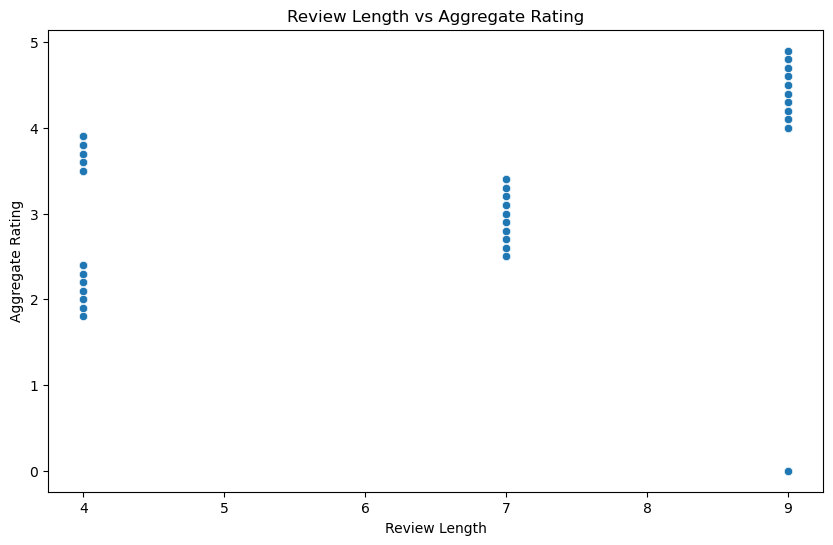

(Rating text
 Average      3737
 Not rated    2148
 Good         2100
 Very Good    1079
 Excellent     301
 Poor          186
 Name: count, dtype: int64,
 7.020730813527379)

In [40]:
# Check for unique values in the Rating_text column
rating_text_counts = data['Rating text'].value_counts()

# Adding a column for review length (based on Rating_text length)
data['Review Length'] = data['Rating text'].apply(len)

# Calculate the average review length
average_review_length = data['Review Length'].mean()

# Explore the relationship between review length and aggregate rating
plt.figure(figsize=(10,6))
sns.scatterplot(x='Review Length', y='Aggregate rating', data=data)
plt.title('Review Length vs Aggregate Rating')
plt.xlabel('Review Length')
plt.ylabel('Aggregate Rating')
plt.show()

# Print results
rating_text_counts, average_review_length

# Level 3 - Task 2

In [47]:
# Task: Votes Analysis
# Identify the restaurants with the highest and lowest number of votes.
# Analyze if there is a correlation between the number of votes and the rating of a restaurant.

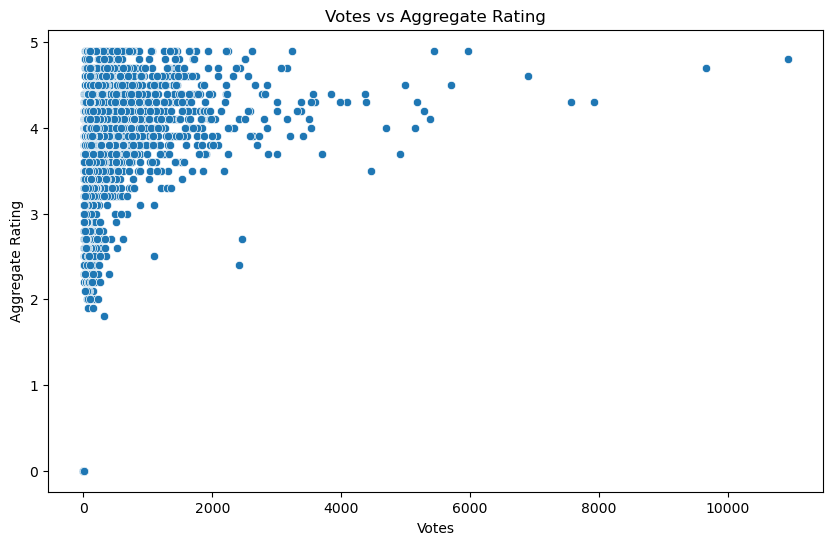

(Restaurant Name      Toit
 Votes               10934
 Aggregate rating      4.8
 Name: 728, dtype: object,
 Restaurant Name     Cantinho da Gula
 Votes                              0
 Aggregate rating                 0.0
 Name: 69, dtype: object,
 0.31369058419540996)

In [51]:
# Convert 'Votes' to numeric (in case there are non-numeric values)
data['Votes'] = pd.to_numeric(data['Votes'], errors='coerce')

# Find the restaurant with the highest and lowest number of votes
max_votes_restaurant = data.loc[data['Votes'].idxmax()]
min_votes_restaurant = data.loc[data['Votes'].idxmin()]

# Calculate the correlation between the number of votes and the aggregate rating
correlation = data[['Votes', 'Aggregate rating']].corr().iloc[0,1]

# Visualize the relationship between the number of votes and aggregate rating
plt.figure(figsize=(10,6))
sns.scatterplot(x='Votes', y='Aggregate rating', data=data)
plt.title('Votes vs Aggregate Rating')
plt.xlabel('Votes')
plt.ylabel('Aggregate Rating')
plt.show()

# Output the highest and lowest votes restaurants and the correlation
max_votes_restaurant[['Restaurant Name', 'Votes', 'Aggregate rating']], min_votes_restaurant[['Restaurant Name', 'Votes', 'Aggregate rating']], correlation

# Level 3 - Task 3

In [55]:
# Task: Price Range vs. Online Delivery and Table Booking
# Analyze if there is a relationship between the price range and the availability of online delivery and table booking.
# Determine if higher-priced restaurants are more likely to offer these services.

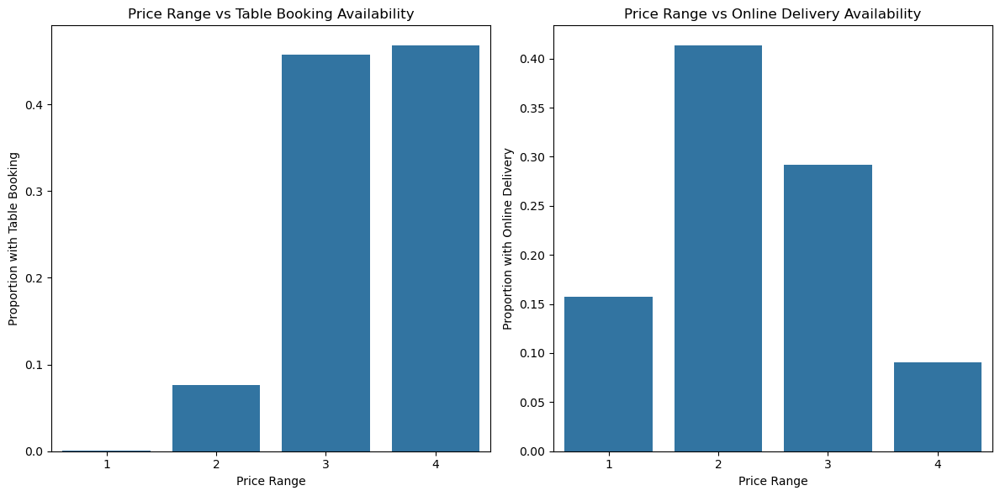

(Price range
 1    0.000225
 2    0.076775
 3    0.457386
 4    0.467577
 Name: Has Table booking, dtype: float64,
 Price range
 1    0.157741
 2    0.413106
 3    0.291903
 4    0.090444
 Name: Has Online delivery, dtype: float64)

In [57]:
# Convert relevant columns to boolean for easier analysis
data['Has Table booking'] = data['Has Table booking'].map({'Yes': 1, 'No': 0})
data['Has Online delivery'] = data['Has Online delivery'].map({'Yes': 1, 'No': 0})

# Group by price range and calculate the mean availability of online delivery and table booking
price_table_booking = data.groupby('Price range')['Has Table booking'].mean()
price_online_delivery = data.groupby('Price range')['Has Online delivery'].mean()

# Plot the relationship between price range and availability of table booking
plt.figure(figsize=(12,6))

plt.subplot(1, 2, 1)
sns.barplot(x=price_table_booking.index, y=price_table_booking.values)
plt.title('Price Range vs Table Booking Availability')
plt.xlabel('Price Range')
plt.ylabel('Proportion with Table Booking')

# Plot the relationship between price range and availability of online delivery
plt.subplot(1, 2, 2)
sns.barplot(x=price_online_delivery.index, y=price_online_delivery.values)
plt.title('Price Range vs Online Delivery Availability')
plt.xlabel('Price Range')
plt.ylabel('Proportion with Online Delivery')

plt.tight_layout()
plt.show()

# Output the analysis results
price_table_booking, price_online_delivery